In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error,roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix
import math
import csv
import datetime as dt

In [2]:
df = pd.read_excel('Company_Data2015-1.xlsx', sheet_name='Sheet2')
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [3]:
df.shape

(3586, 67)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
Co_Code                                3586 non-null int64
Co_Name                                3586 non-null object
Networth Next Year                     3586 non-null float64
Equity Paid Up                         3586 non-null float64
Networth                               3586 non-null float64
Capital Employed                       3586 non-null float64
Total Debt                             3586 non-null float64
Gross Block                            3586 non-null float64
Net Working Capital                    3586 non-null float64
Current Assets                         3586 non-null float64
Current Liabilities and Provisions     3586 non-null float64
Total Assets/Liabilities               3586 non-null float64
Gross Sales                            3586 non-null float64
Net Sales                              3586 non-null float64
Other Income                           358

In [5]:
df.describe().round(2)

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
count,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,...,3585.00,3585.00,3585.00,3585.00,3585.00,3586.00,3586.00,3483.00,3586.00,3586.00
mean,16065.39,725.05,62.97,649.75,2799.61,1994.82,594.18,410.81,1960.35,391.99,...,-51.16,-109.21,-311.57,-307.01,-365.06,603.89,2057.85,79.64,0.82,61.88
std,19776.82,4769.68,778.76,4091.99,26975.14,23652.84,4871.55,6301.22,22577.57,2675.00,...,1795.13,3057.64,10921.59,10676.15,12500.05,10636.76,54169.48,137.85,1.20,976.82
min,4.00,-8021.60,0.00,-7027.48,-1824.75,-0.72,-41.19,-13162.42,-0.91,-0.23,...,-78870.45,-141600.00,-590500.00,-572000.00,-688600.00,0.00,0.00,-199.00,-0.33,-61.00
25%,3029.25,3.98,3.75,3.89,7.60,0.03,0.57,0.94,4.00,0.73,...,0.00,0.00,0.00,0.00,0.00,8.00,8.00,0.00,0.07,0.27
50%,6077.50,19.02,8.29,18.58,39.09,7.49,15.87,10.14,24.54,9.23,...,8.07,5.23,4.69,3.89,1.59,49.00,39.00,35.00,0.48,1.53
75%,24269.50,123.80,19.52,117.30,226.60,72.35,131.90,61.18,135.28,65.65,...,18.99,14.29,14.11,11.39,7.41,106.00,89.00,96.00,1.16,4.91
max,72493.00,111729.10,42263.46,81657.35,714001.25,652823.81,128477.59,223257.56,721166.00,83232.98,...,19233.33,19195.70,15640.00,15640.00,15266.67,514721.00,2034145.00,996.00,17.63,43404.00


In [6]:
df_dictonary = pd.read_excel("Data_Dictionary.xlsx")
df_dictonary

,#,Field Name,Description,New Field Name
0,1,Co_Code,Company Code,Co_Code
1,2,Co_Name,Company Name,Co_Name
2,3,Networth Next Year,Value of a company as on 2016 - Next Year(diff...,Networth_Next_Year
3,4,Equity Paid Up,Amount that has been received by the company t...,Equity_Paid_Up
4,5,Networth,Value of a company as on 2015 - Current Year,Networth
5,6,Capital Employed,Total amount of capital used for the acquisiti...,Capital_Employed
6,7,Total Debt,The sum of money borrowed by the company and i...,Total_Debt
7,8,Gross Block,Total value of all of the assets that a compan...,Gross_Block
8,9,Net Working Capital,The difference between a company's current ass...,Net_Working_Capital
9,10,Current Assets,All the assets of a company that are expected ...,Curr_Assets


In [7]:
# renaming the messey column name using the given new names in data dictonary

df.rename(columns=df_dictonary.set_index('Field Name')['New Field Name'], inplace=True)

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

Co_Code                                0
Co_Name                                0
Networth_Next_Year                     0
Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Block                            0
Net_Working_Capital                    0
Curr_Assets                            0
Curr_Liab_and_Prov                     0
Total_Assets_to_Liab                   0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Prod                           0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP              

In [10]:
df_new = df.drop(['Co_Code', 'Co_Name'], axis = 1)
df_new.head()

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,...,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


### 1.1 Outlier Treatment

Shape before Outliers Treatment (3586, 65)


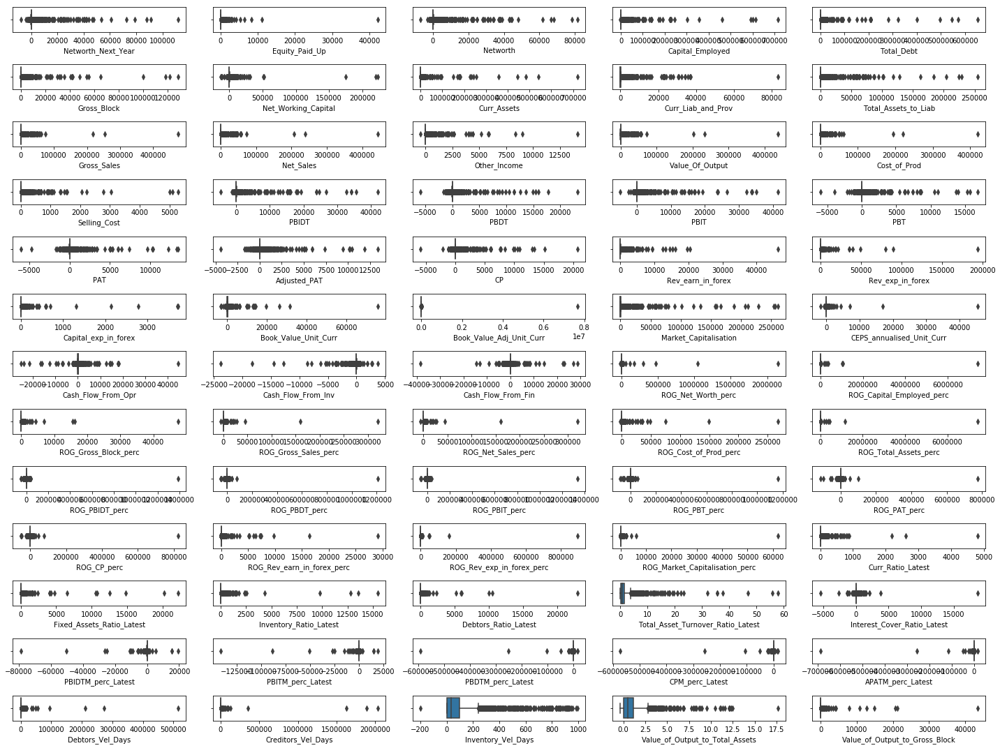

In [11]:
data_plot=df_new
fig=plt.figure(figsize=(20,15));
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(13,5,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape before Outliers Treatment',df_new.shape)

In [12]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [13]:
for column in df_new.columns:
    lr,ur=remove_outlier(df_new[column])
    df_new[column]=np.where(df_new[column]>ur,ur,df_new[column])
    df_new[column]=np.where(df_new[column]<lr,lr,df_new[column])

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


Shape after Outliers Treatment (3586, 65)


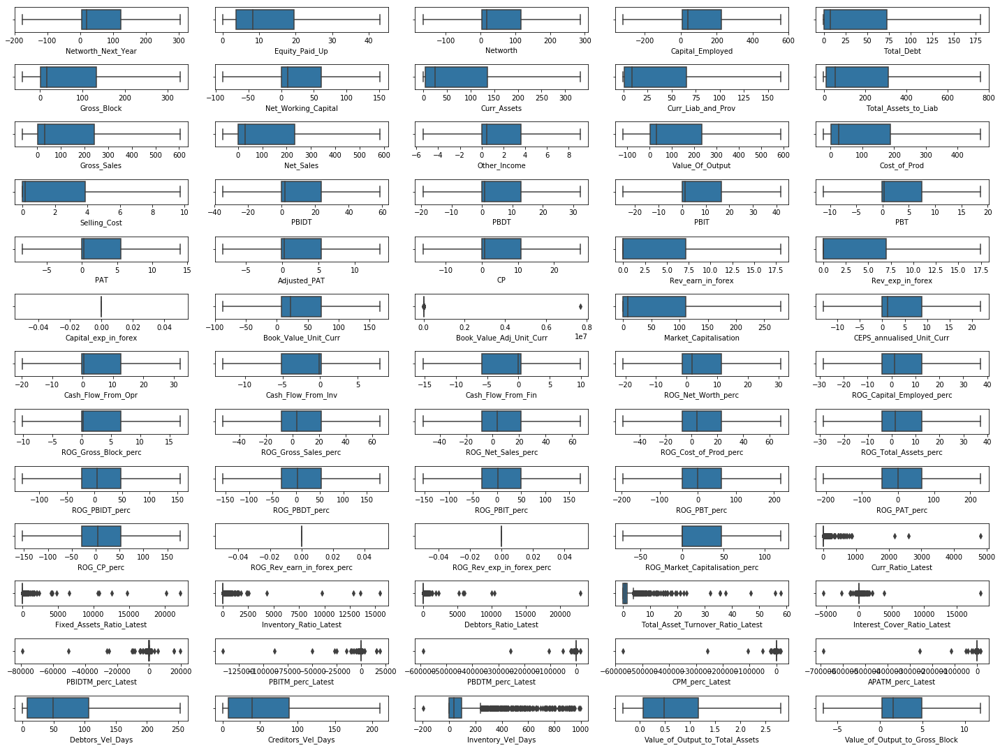

In [14]:
data_plot=df_new
fig=plt.figure(figsize=(20,15));
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(13,5,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape after Outliers Treatment',df_new.shape)

### 1.2 Missing Value Treatment

In [15]:
for column in df_new.columns:
    if df_new[column].dtype != 'object':
        median = df_new[column].median()
        df_new[column] = df_new[column].fillna(median)    
        
df_new.isnull().sum() 

Networth_Next_Year                   0
Equity_Paid_Up                       0
Networth                             0
Capital_Employed                     0
Total_Debt                           0
Gross_Block                          0
Net_Working_Capital                  0
Curr_Assets                          0
Curr_Liab_and_Prov                   0
Total_Assets_to_Liab                 0
Gross_Sales                          0
Net_Sales                            0
Other_Income                         0
Value_Of_Output                      0
Cost_of_Prod                         0
Selling_Cost                         0
PBIDT                                0
PBDT                                 0
PBIT                                 0
PBT                                  0
PAT                                  0
Adjusted_PAT                         0
CP                                   0
Rev_earn_in_forex                    0
Rev_exp_in_forex                     0
Capital_exp_in_forex     

### 1.3 Transform Target variable into 0 and 1

In [16]:
df_new['default'] = np.where((df_new['Networth_Next_Year'] > 0), 0, 1)
df_new.drop(['Networth_Next_Year'], axis = 1, inplace = True)

In [17]:
df_new['default'].value_counts()

0    3198
1     388
Name: default, dtype: int64

In [18]:
df_new['default'].value_counts(normalize = True)

0    0.891801
1    0.108199
Name: default, dtype: float64

In [19]:
df_new.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,...,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
0,43.16875,-166.215,-320.90125,180.83,328.8825,-89.40625,40.50000,163.02625,109.6000,0.00000,...,0.00,0.00,0.00,0.00,0.0,0.0,45.0,0.00,0.00,1
1,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-39.74,-57.74,-57.74,-87.18,29.0,101.0,2.0,0.31,0.24,1
2,43.16875,287.405,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,392.13000,...,-5516.98,-7780.25,-7723.67,-7961.51,97.0,210.5,0.0,-0.03,-0.26,1
3,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-7.21,-48.13,-47.70,-51.58,93.0,63.0,2.0,0.24,1.90,1
4,43.16875,-166.215,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,38.72000,...,-400.55,-845.88,379.79,274.79,253.0,210.5,0.0,0.01,0.05,1


### 1.4 Univariate (4 marks) & Bivariate ( 6marks) analysis with proper interpretation. (You may choose to include only those variables which were significant in the model building)

##### Univariate


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


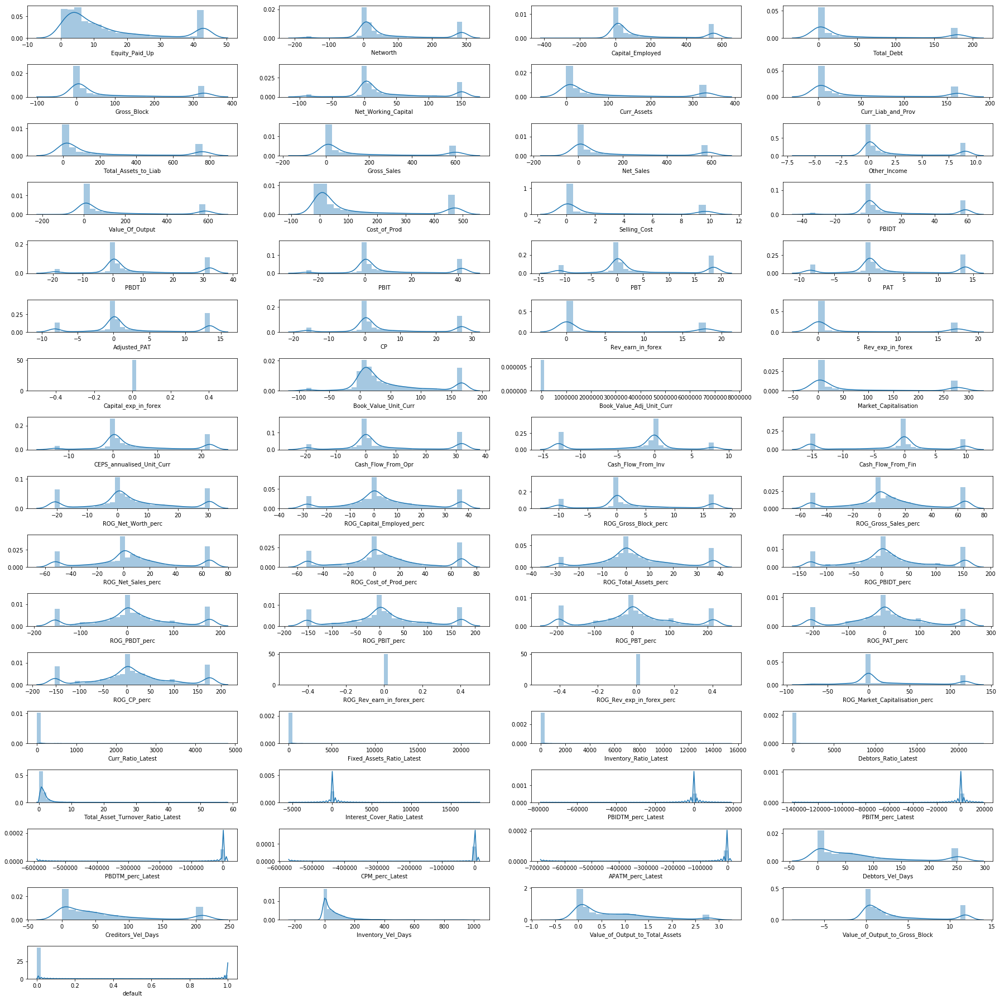

In [20]:
data_plot=df_new
fig=plt.figure(figsize=(25,25));
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(17,4,i+1)
    sns.distplot(data_plot[data_plot.columns[i]], kde=True)
    plt.tight_layout()

### Bivariate

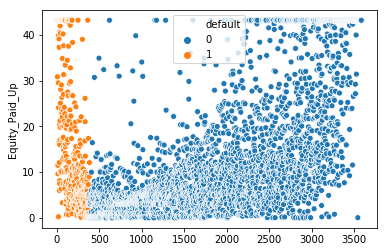

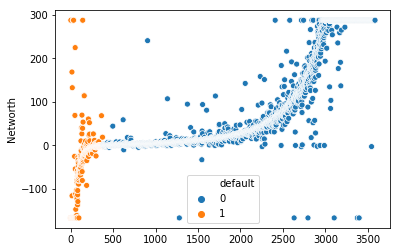

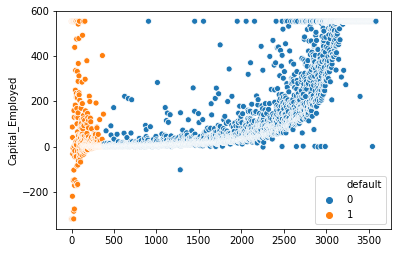

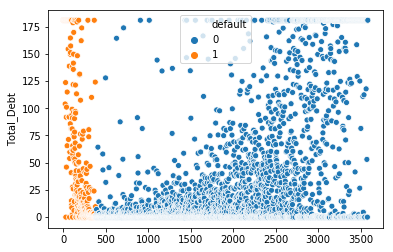

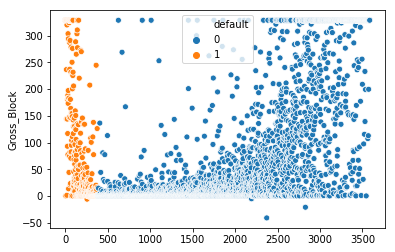

...

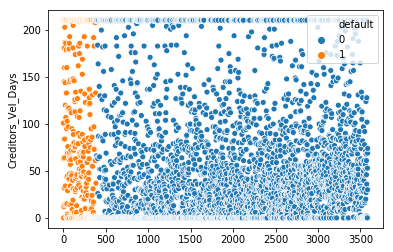

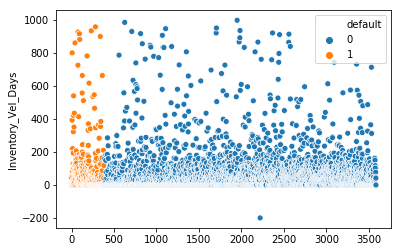

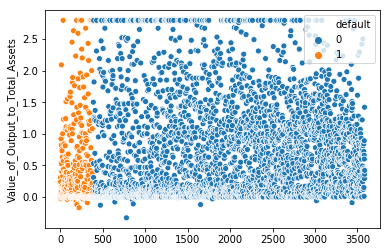

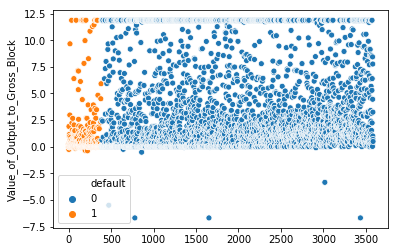

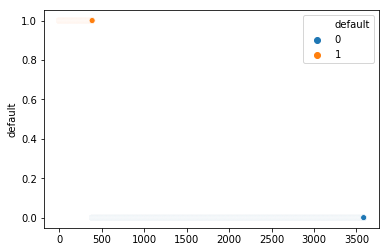

In [21]:
#scatter plot with hue based on default
splot_cols=df_new.columns
for i in splot_cols:
    sns.scatterplot(x=df_new.index, y=df_new[i], hue=df_new['default'])
    plt.show()

In [22]:
df_new.corr()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,...,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
Equity_Paid_Up,1.000000,0.575311,0.678049,0.573822,0.615089,0.388607,0.631646,0.646325,0.695357,0.564579,...,-0.033410,-0.027134,-0.027406,-0.026719,0.041409,0.105388,0.034090,-0.083063,-0.037049,0.025170
Networth,0.575311,1.000000,0.873306,0.535012,0.665375,0.623119,0.760024,0.683618,0.836822,0.721942,...,0.011467,0.016191,0.014730,0.017309,-0.043877,-0.032158,-0.004814,0.057532,0.050899,-0.335681
Capital_Employed,0.678049,0.873306,1.000000,0.781394,0.824900,0.688619,0.902837,0.834573,0.977779,0.825233,...,-0.011590,-0.007029,-0.007937,-0.006214,0.001483,0.034255,0.027944,0.045412,0.003880,-0.138860
Total_Debt,0.573822,0.535012,0.781394,1.000000,0.781595,0.574341,0.798859,0.780363,0.806901,0.727858,...,-0.051440,-0.049932,-0.049967,-0.049196,0.039065,0.100730,0.060456,0.069394,-0.058453,0.071048
Gross_Block,0.615089,0.665375,0.824900,0.781595,1.000000,0.527678,0.814709,0.850400,0.856130,0.833787,...,-0.030033,-0.026179,-0.026361,-0.025992,-0.037547,0.039046,0.046565,0.124371,-0.163528,-0.003953
Net_Working_Capital,0.388607,0.623119,0.688619,0.574341,0.527678,1.000000,0.761698,0.554177,0.657365,0.645461,...,0.008011,0.019618,0.018487,0.020172,0.095710,-0.005188,0.078149,0.135143,0.073855,-0.177642
Curr_Assets,0.631646,0.760024,0.902837,0.798859,0.814709,0.761698,1.000000,0.912895,0.934370,0.885011,...,-0.019857,-0.016443,-0.017351,-0.015725,0.041023,0.076575,0.053541,0.135049,0.043527,-0.089554
Curr_Liab_and_Prov,0.646325,0.683618,0.834573,0.780363,0.850400,0.554177,0.912895,1.000000,0.906441,0.866521,...,-0.048003,-0.048742,-0.049048,-0.048414,0.011264,0.141375,0.045978,0.128297,-0.007227,0.001439
Total_Assets_to_Liab,0.695357,0.836822,0.977779,0.806901,0.856130,0.657365,0.934370,0.906441,1.000000,0.854365,...,-0.020452,-0.017266,-0.018076,-0.016585,0.008251,0.073314,0.032164,0.057024,-0.000622,-0.089776
Gross_Sales,0.564579,0.721942,0.825233,0.727858,0.833787,0.645461,0.885011,0.866521,0.854365,1.000000,...,0.006929,0.015005,0.014628,0.015573,-0.093344,-0.041758,-0.000800,0.310407,0.076647,-0.114624


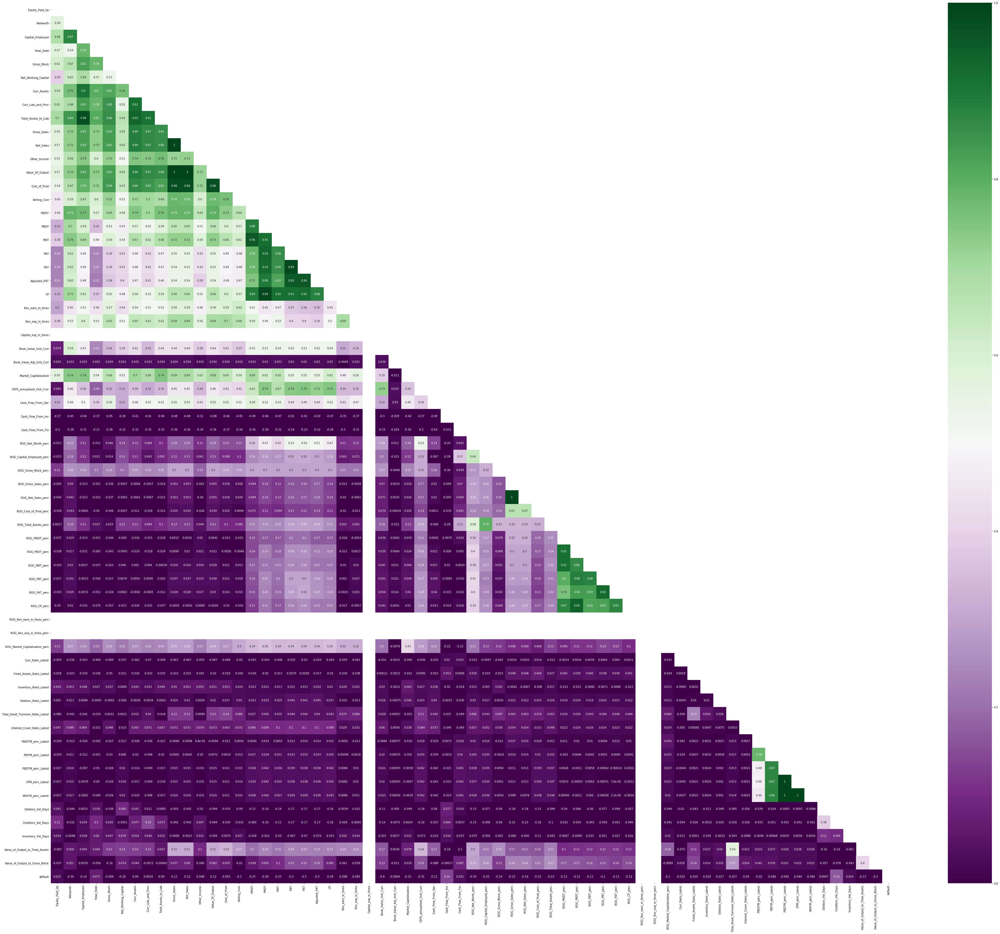

In [23]:
plt.figure(figsize = (70,60))
sns.heatmap(df_new.corr(), annot=True,mask=np.triu(df_new.corr()),cmap ='PRGn', vmin = 0, vmax= 1);

In [24]:
#let's drop the columns which do not contribute to the output

df_new.drop(['Capital_exp_in_forex','ROG_Rev_exp_in_forex_perc', 'ROG_Rev_earn_in_forex_perc'], axis = 1, inplace = True)

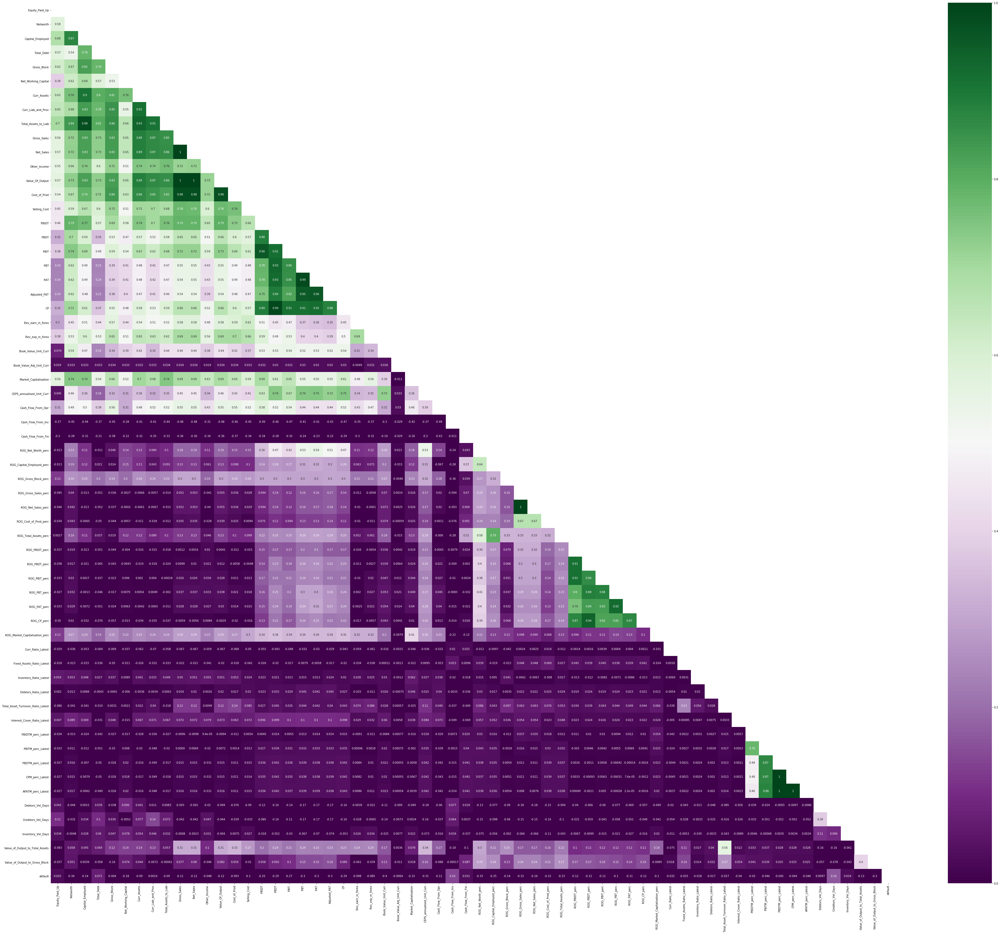

In [25]:
#correlation heatmap after removing redundant columns

plt.figure(figsize = (70,60))
sns.heatmap(df_new.corr(), annot=True,mask=np.triu(df_new.corr()),cmap ='PRGn', vmin = 0, vmax= 1);

### Dimensionality Reduction

In [26]:
high_corr_matrix = df_new.corr().abs()
upper_tri_cor_mat = high_corr_matrix.where(np.triu(np.ones(high_corr_matrix.shape),k=1).astype(np.bool))

In [27]:
# Droping the column with high correlation

to_drop_high_corr_var = [column for column in upper_tri_cor_mat.columns if any(upper_tri_cor_mat[column] > 0.90)]
print('These are the highly correlated variables in the dataset with more than 90% of correlation', '\n'); print(to_drop_high_corr_var)

These are the highly correlated variables in the dataset with more than 90% of correlation 

['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest']


In [28]:
# Now we are droping the columns which are in the list 'to_drop' from the dataframe
df_new.drop(['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest'], axis = 1, inplace = True)

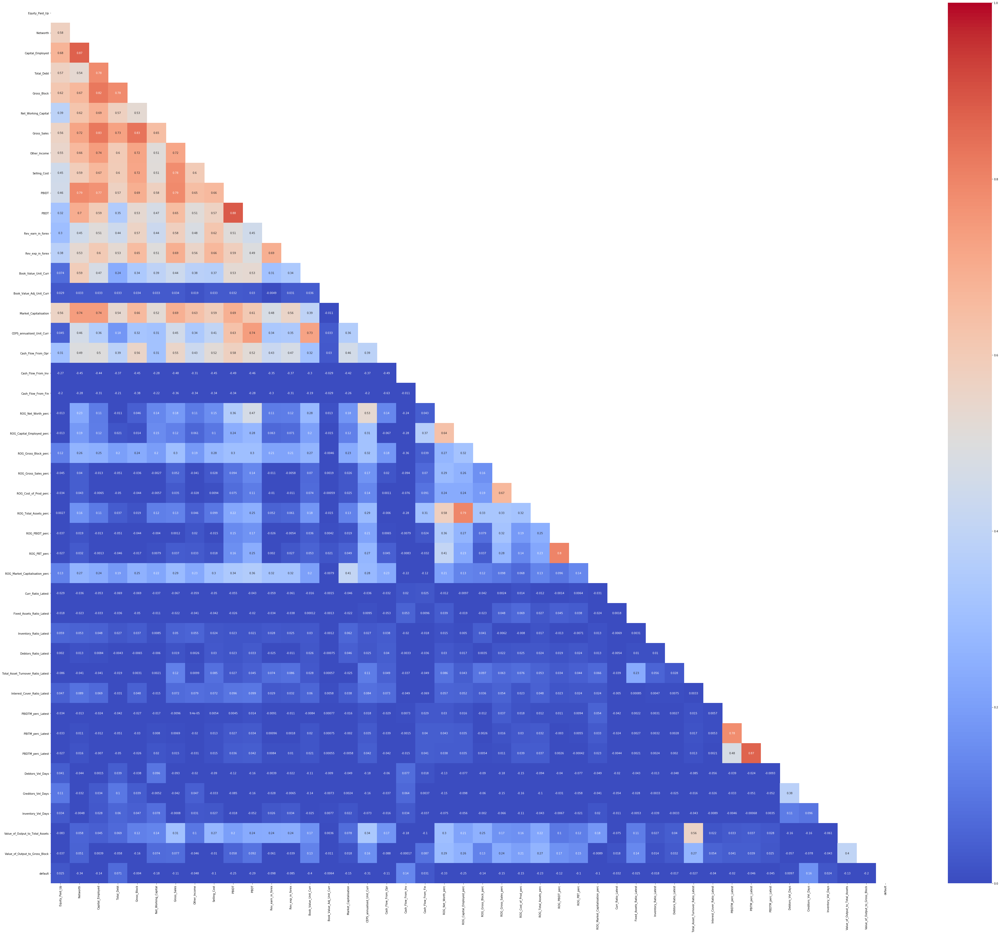

In [29]:
#correlation heatmap after removing redundant columns

plt.figure(figsize = (70,60))
sns.heatmap(df_new.corr(), annot=True,mask=np.triu(df_new.corr()),cmap ='coolwarm', vmin = 0, vmax= 1);

### 1.5 Train Test Split

In [30]:
x = df_new.drop(['default'], axis=1)
y = df_new['default']

In [31]:
# Scaling the dataset

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.33,random_state=42,stratify=df_new['default'])

In [33]:
X_train.shape

(2402, 43)

In [34]:
X_test.shape

(1184, 43)

In [35]:
y_train.shape

(2402,)

In [36]:
y_test.shape

(1184,)

### 1.6 Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach

In [37]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [38]:
LogR = LogisticRegression()
selector = RFE(estimator = LogR, n_features_to_select=15, step=1)
selector = selector.fit(X_train, y_train)
selector.n_features_

15

In [39]:
selector.ranking_

array([28,  1,  1,  1, 20,  4, 10,  8,  1,  1, 18, 13,  1,  1, 29,  1,  1,
       26, 14, 27,  1,  6, 12, 19,  2,  5, 24, 15, 21,  1,  3,  1,  1, 17,
        1, 23, 22,  9,  7, 16, 25, 11,  1])

In [40]:
df_ranked = pd.DataFrame({'Feature': X_train.columns, 'Rank': selector.ranking_})
df_ranked

,Feature,Rank
0,Equity_Paid_Up,28
1,Networth,1
2,Capital_Employed,1
3,Total_Debt,1
4,Gross_Block,20
5,Net_Working_Capital,4
6,Gross_Sales,10
7,Other_Income,8
8,Selling_Cost,1
9,PBIDT,1


In [41]:
df_ranked1 = pd.DataFrame(df_ranked[df_ranked['Rank'] == 1])
df_ranked1

,Feature,Rank
1,Networth,1
2,Capital_Employed,1
3,Total_Debt,1
8,Selling_Cost,1
9,PBIDT,1
12,Rev_exp_in_forex,1
13,Book_Value_Unit_Curr,1
15,Market_Capitalisation,1
16,CEPS_annualised_Unit_Curr,1
20,ROG_Net_Worth_perc,1


In [42]:
df_ranked1['Feature']

1                           Networth
2                   Capital_Employed
3                         Total_Debt
8                       Selling_Cost
9                              PBIDT
12                  Rev_exp_in_forex
13              Book_Value_Unit_Curr
15             Market_Capitalisation
16         CEPS_annualised_Unit_Curr
20                ROG_Net_Worth_perc
29                 Curr_Ratio_Latest
31            Inventory_Ratio_Latest
32              Debtors_Ratio_Latest
34       Interest_Cover_Ratio_Latest
42    Value_of_Output_to_Gross_Block
Name: Feature, dtype: object

In [43]:

X_train = X_train[['Networth','Capital_Employed','Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation', 'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest', 'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block']]
X_test = X_test[['Networth','Capital_Employed','Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation', 'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest', 'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block']]

In [44]:
X_train.head(3)

,Networth,Capital_Employed,Total_Debt,Selling_Cost,PBIDT,Rev_exp_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,ROG_Net_Worth_perc,Curr_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Interest_Cover_Ratio_Latest,Value_of_Output_to_Gross_Block
842,-0.621680,-0.716658,-0.694776,-0.663455,-0.589992,-0.622212,-0.577923,-0.674189,-0.491232,-0.268120,0.338774,-0.082498,-0.067464,-0.046592,-0.755091
1057,-0.605740,-0.707757,-0.695216,-0.628510,-0.574833,-0.622212,-0.571265,-0.674189,-0.418930,1.854366,0.002181,0.019256,-0.044642,-0.058337,0.186164
1595,-0.533034,-0.668736,-0.695509,-0.666143,-0.586624,-0.622212,-0.739546,1.722583,-0.534614,-0.204475,-0.051796,-0.078001,-0.063766,-0.046592,-0.818491


### Modelling using Logistic Regression

In [45]:
import statsmodels.formula.api as SM

In [46]:
#Statsmodel requires the labelled data, therefore, concatinating the y label to the train set.
Default_train = pd.concat([X_train,y_train], axis=1)
Default_test = pd.concat([X_test,y_test], axis=1)

In [47]:
Default_train["default"].value_counts()

0    2142
1     260
Name: default, dtype: int64

In [48]:
Default_train.default.sum() / len(Default_train.default)

0.10824313072439634

### Feature Selection

##### Model 1

In [49]:
Default_train.columns

Index(['Networth', 'Capital_Employed', 'Total_Debt', 'Selling_Cost', 'PBIDT',
       'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation',
       'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest',
       'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest',
       'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block',
       'default'],
      dtype='object')

In [50]:

model_1 = SM.logit(formula = 'default ~ Networth + Capital_Employed + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Debtors_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()


Optimization terminated successfully.
         Current function value: 0.137806
         Iterations 12


In [51]:
#Checking the parameters

model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2386
Method:                           MLE   Df Model:                           15
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5980
Time:                        15:33:23   Log-Likelihood:                -331.01
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                2.301e-200
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5240      0.505    -14.887      0.000      -8.515      -6.533
Networth                          -0.6488      0.417     -1.557      0.119      -1.465       0.168
Capital_Employed                  -0.5778      0.566     -1.020      0.308      -1.688       0.532
Total_Debt                         1.3585      0.375      3.622      0.000       0.623       2.094
Selling_Cost                      -0.3243      0.278     -1.168      0.243      -0.868       0.220
PBIDT                             -0.5765      0.329     -1.752      0.080      -1.221       0.068
Rev_exp_in_forex                   0.3099      0.226      1.372      0.170      -0.133       0.753
Book_Value_Unit_Curr              -6.0852      0.643     -9.460      0.000      -7.346      -4.824
Market_Capitalisation             -0.5763      0.307     -1.880      0.060      -1.177       0.024
CEPS_annualised_Unit_Curr         -0.4984      0.354     -1.406      0.160      -1.193       0.196
ROG_Net_Worth_perc                -0.4011      0.132     -3.045      0.002      -0.659      -0.143
Curr_Ratio_Latest                 -0.6999      0.651     -1.074      0.283      -1.977       0.577
Inventory_Ratio_Latest            -1.5284      1.127     -1.356      0.175      -3.738       0.681
Debtors_Ratio_Latest              -1.1137      1.821     -0.612      0.541      -4.683       2.455
Interest_Cover_Ratio_Latest       -0.4314      0.329     -1.312      0.190      -1.076       0.213
Value_of_Output_to_Gross_Block    -0.4849      0.160     -3.027      0.002      -0.799      -0.171
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [52]:
#checking VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [53]:
X = Default_train.drop('default', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
1,Capital_Employed,10.551510
0,Networth,7.834042
4,PBIDT,4.958060
8,CEPS_annualised_Unit_Curr,3.867756
2,Total_Debt,3.726912
6,Book_Value_Unit_Curr,2.883423
7,Market_Capitalisation,2.637387
3,Selling_Cost,2.561778
5,Rev_exp_in_forex,2.035821
9,ROG_Net_Worth_perc,1.669240


In [54]:
X = X.drop('Capital_Employed', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
3,PBIDT,4.937125
0,Networth,4.186395
7,CEPS_annualised_Unit_Curr,3.863618
5,Book_Value_Unit_Curr,2.882603
6,Market_Capitalisation,2.620160
2,Selling_Cost,2.558143
1,Total_Debt,2.056451
4,Rev_exp_in_forex,2.027065
8,ROG_Net_Worth_perc,1.652846
13,Value_of_Output_to_Gross_Block,1.118399


In [55]:
Default_train.drop('Capital_Employed', axis=1, inplace=True)
Default_train.columns

Index(['Networth', 'Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex',
       'Book_Value_Unit_Curr', 'Market_Capitalisation',
       'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest',
       'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest',
       'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block',
       'default'],
      dtype='object')

##### Model 2.

In [56]:
#Creating our first model using all variables
model_2 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Debtors_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()


Optimization terminated successfully.
         Current function value: 0.138026
         Iterations 12


In [57]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2387
Method:                           MLE   Df Model:                           14
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5974
Time:                        15:33:24   Log-Likelihood:                -331.54
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                4.540e-201
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5470      0.510    -14.811      0.000      -8.546      -6.548
Networth                          -0.8686      0.352     -2.470      0.014      -1.558      -0.179
Total_Debt                         1.0725      0.242      4.431      0.000       0.598       1.547
Selling_Cost                      -0.3760      0.279     -1.345      0.178      -0.924       0.172
PBIDT                             -0.5928      0.330     -1.799      0.072      -1.239       0.053
Rev_exp_in_forex                   0.3181      0.225      1.411      0.158      -0.124       0.760
Book_Value_Unit_Curr              -6.1148      0.640     -9.549      0.000      -7.370      -4.860
Market_Capitalisation             -0.6607      0.300     -2.204      0.028      -1.248      -0.073
CEPS_annualised_Unit_Curr         -0.4813      0.352     -1.368      0.171      -1.171       0.208
ROG_Net_Worth_perc                -0.3968      0.131     -3.026      0.002      -0.654      -0.140
Curr_Ratio_Latest                 -0.7180      0.657     -1.093      0.274      -2.005       0.569
Inventory_Ratio_Latest            -1.7831      1.198     -1.488      0.137      -4.132       0.566
Debtors_Ratio_Latest              -1.0703      1.814     -0.590      0.555      -4.626       2.485
Interest_Cover_Ratio_Latest       -0.4291      0.331     -1.297      0.195      -1.078       0.219
Value_of_Output_to_Gross_Block    -0.4794      0.159     -3.006      0.003      -0.792      -0.167
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Debtors_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 3

In [58]:
model_3 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138139
         Iterations 11


In [59]:
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2388
Method:                           MLE   Df Model:                           13
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5971
Time:                        15:33:24   Log-Likelihood:                -331.81
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                6.691e-202
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5077      0.502    -14.955      0.000      -8.492      -6.524
Networth                          -0.8494      0.351     -2.419      0.016      -1.538      -0.161
Total_Debt                         1.0688      0.243      4.403      0.000       0.593       1.545
Selling_Cost                      -0.3801      0.278     -1.366      0.172      -0.925       0.165
PBIDT                             -0.5753      0.330     -1.742      0.081      -1.222       0.072
Rev_exp_in_forex                   0.3218      0.225      1.431      0.152      -0.119       0.762
Book_Value_Unit_Curr              -6.1340      0.641     -9.568      0.000      -7.391      -4.877
Market_Capitalisation             -0.6840      0.294     -2.325      0.020      -1.261      -0.107
CEPS_annualised_Unit_Curr         -0.4861      0.353     -1.379      0.168      -1.177       0.205
ROG_Net_Worth_perc                -0.4018      0.131     -3.065      0.002      -0.659      -0.145
Curr_Ratio_Latest                 -0.7118      0.654     -1.088      0.277      -1.994       0.571
Inventory_Ratio_Latest            -1.8011      1.171     -1.538      0.124      -4.097       0.495
Interest_Cover_Ratio_Latest       -0.4319      0.329     -1.314      0.189      -1.076       0.212
Value_of_Output_to_Gross_Block    -0.4848      0.158     -3.070      0.002      -0.794      -0.175
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Curr_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 4

In [60]:
model_4 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138564
         Iterations 11


In [61]:
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2389
Method:                           MLE   Df Model:                           12
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5958
Time:                        15:33:24   Log-Likelihood:                -332.83
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                1.986e-202
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5509      0.506    -14.928      0.000      -8.542      -6.560
Networth                          -0.8387      0.353     -2.379      0.017      -1.530      -0.148
Total_Debt                         1.0896      0.243      4.480      0.000       0.613       1.566
Selling_Cost                      -0.3819      0.280     -1.362      0.173      -0.932       0.168
PBIDT                             -0.5714      0.332     -1.722      0.085      -1.222       0.079
Rev_exp_in_forex                   0.3336      0.227      1.472      0.141      -0.111       0.778
Book_Value_Unit_Curr              -6.2499      0.641     -9.747      0.000      -7.507      -4.993
Market_Capitalisation             -0.6961      0.293     -2.375      0.018      -1.271      -0.122
CEPS_annualised_Unit_Curr         -0.4864      0.355     -1.370      0.171      -1.182       0.209
ROG_Net_Worth_perc                -0.4182      0.132     -3.178      0.001      -0.676      -0.160
Inventory_Ratio_Latest            -1.7889      1.194     -1.498      0.134      -4.129       0.551
Interest_Cover_Ratio_Latest       -0.4436      0.324     -1.369      0.171      -1.078       0.191
Value_of_Output_to_Gross_Block    -0.4809      0.157     -3.061      0.002      -0.789      -0.173
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Selling_Cost has the highest p-value and is insignificant, therefore, we need to eliminate it

###### Model 5

In [62]:
model_5 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138969
         Iterations 11


In [63]:
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2390
Method:                           MLE   Df Model:                           11
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5946
Time:                        15:33:24   Log-Likelihood:                -333.80
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                5.379e-203
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5288      0.505    -14.918      0.000      -8.518      -6.540
Networth                          -0.8268      0.353     -2.343      0.019      -1.519      -0.135
Total_Debt                         0.9580      0.225      4.258      0.000       0.517       1.399
PBIDT                             -0.5998      0.329     -1.824      0.068      -1.244       0.045
Rev_exp_in_forex                   0.2174      0.213      1.022      0.307      -0.199       0.634
Book_Value_Unit_Curr              -6.3105      0.645     -9.783      0.000      -7.575      -5.046
Market_Capitalisation             -0.7353      0.293     -2.511      0.012      -1.309      -0.161
CEPS_annualised_Unit_Curr         -0.4640      0.352     -1.319      0.187      -1.153       0.226
ROG_Net_Worth_perc                -0.3982      0.130     -3.070      0.002      -0.653      -0.144
Inventory_Ratio_Latest            -1.9713      1.267     -1.555      0.120      -4.455       0.513
Interest_Cover_Ratio_Latest       -0.4464      0.328     -1.361      0.173      -1.089       0.196
Value_of_Output_to_Gross_Block    -0.4859      0.159     -3.059      0.002      -0.797      -0.175
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Rev_exp_in_forex has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 6

In [64]:
model_6 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()


Optimization terminated successfully.
         Current function value: 0.139182
         Iterations 11


In [65]:
model_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2391
Method:                           MLE   Df Model:                           10
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5940
Time:                        15:33:25   Log-Likelihood:                -334.32
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                8.798e-204
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5167      0.504    -14.910      0.000      -8.505      -6.529
Networth                          -0.8178      0.349     -2.344      0.019      -1.502      -0.134
Total_Debt                         1.0583      0.202      5.238      0.000       0.662       1.454
PBIDT                             -0.5462      0.323     -1.688      0.091      -1.180       0.088
Book_Value_Unit_Curr              -6.2788      0.642     -9.777      0.000      -7.537      -5.020
Market_Capitalisation             -0.7145      0.287     -2.490      0.013      -1.277      -0.152
CEPS_annualised_Unit_Curr         -0.4606      0.351     -1.312      0.190      -1.149       0.228
ROG_Net_Worth_perc                -0.4063      0.130     -3.128      0.002      -0.661      -0.152
Inventory_Ratio_Latest            -2.0299      1.288     -1.576      0.115      -4.554       0.494
Interest_Cover_Ratio_Latest       -0.4404      0.332     -1.325      0.185      -1.092       0.211
Value_of_Output_to_Gross_Block    -0.4748      0.157     -3.018      0.003      -0.783      -0.166
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### CEPS_annualised_Unit_Curr has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 7

In [66]:
model_7 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.139541
         Iterations 11


In [67]:
model_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2392
Method:                           MLE   Df Model:                            9
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5930
Time:                        15:33:25   Log-Likelihood:                -335.18
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                1.928e-204
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.3533      0.484    -15.183      0.000      -8.303      -6.404
Networth                          -0.8102      0.353     -2.292      0.022      -1.503      -0.118
Total_Debt                         1.1250      0.199      5.641      0.000       0.734       1.516
PBIDT                             -0.7685      0.286     -2.685      0.007      -1.329      -0.208
Book_Value_Unit_Curr              -6.2193      0.638     -9.750      0.000      -7.470      -4.969
Market_Capitalisation             -0.7431      0.286     -2.596      0.009      -1.304      -0.182
ROG_Net_Worth_perc                -0.4692      0.122     -3.847      0.000      -0.708      -0.230
Inventory_Ratio_Latest            -1.9878      1.292     -1.538      0.124      -4.521       0.545
Interest_Cover_Ratio_Latest       -0.4351      0.326     -1.336      0.182      -1.073       0.203
Value_of_Output_to_Gross_Block    -0.4700      0.158     -2.977      0.003      -0.779      -0.161
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Interest_Cover_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 8

In [68]:
model_8 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()


Optimization terminated successfully.
         Current function value: 0.139659
         Iterations 11


In [69]:
model_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2393
Method:                           MLE   Df Model:                            8
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5926
Time:                        15:33:25   Log-Likelihood:                -335.46
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                2.242e-205
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.3385      0.483    -15.186      0.000      -8.286      -6.391
Networth                          -0.8121      0.354     -2.297      0.022      -1.505      -0.119
Total_Debt                         1.1298      0.199      5.677      0.000       0.740       1.520
PBIDT                             -0.7743      0.286     -2.712      0.007      -1.334      -0.215
Book_Value_Unit_Curr              -6.2276      0.640     -9.732      0.000      -7.482      -4.973
Market_Capitalisation             -0.7470      0.286     -2.608      0.009      -1.308      -0.186
ROG_Net_Worth_perc                -0.4691      0.122     -3.852      0.000      -0.708      -0.230
Inventory_Ratio_Latest            -1.9615      1.283     -1.529      0.126      -4.475       0.552
Value_of_Output_to_Gross_Block    -0.4720      0.158     -2.990      0.003      -0.781      -0.163
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Inventory_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

##### Model 9

In [70]:
model_9 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation + ROG_Net_Worth_perc + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.140067
         Iterations 11


In [71]:
model_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2394
Method:                           MLE   Df Model:                            7
Date:                Sun, 08 May 2022   Pseudo R-squ.:                  0.5914
Time:                        15:33:25   Log-Likelihood:                -336.44
converged:                       True   LL-Null:                       -823.47
                                        LLR p-value:                4.858e-206
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.2051      0.466    -15.468      0.000      -8.118      -6.292
Networth                          -0.7906      0.351     -2.250      0.024      -1.479      -0.102
Total_Debt                         1.1148      0.198      5.620      0.000       0.726       1.504
PBIDT                             -0.7480      0.285     -2.625      0.009      -1.306      -0.190
Book_Value_Unit_Curr              -6.2362      0.639     -9.761      0.000      -7.488      -4.984
Market_Capitalisation             -0.7612      0.284     -2.680      0.007      -1.318      -0.205
ROG_Net_Worth_perc                -0.4728      0.121     -3.894      0.000      -0.711      -0.235
Value_of_Output_to_Gross_Block    -0.4841      0.157     -3.080      0.002      -0.792      -0.176
==================================================================================================

Possibly complete quasi-separation: A fraction 0.30 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

###### Now, all the variables are significant and p-value is less than the alpha value 0.05. Therefore, we don't need to eliminate the other variables.

### 1.7 Validate the Model on Test Dataset and state the performance matrices. Also state interpretation from the model

In [72]:
y_prob_pred_9 = model_9.predict(Default_train)

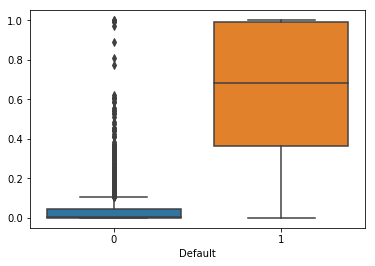

In [73]:
sns.boxplot(x=Default_train['default'],y=y_prob_pred_9)
plt.xlabel('Default');

In [74]:
# Selecting the Optimum threshold

from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(Default_train['default'],y_prob_pred_9)

In [75]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold
print('The optimum threshold is',optimal_threshold)

The optimum threshold is 0.16890979736726344


In [76]:
# Predicting the test data

y_prob_pred_train = model_9.predict(Default_train)
y_prob_pred_train.round(3).head(20)

842     0.080
1057    0.019
1595    0.035
100     0.861
1191    0.010
2163    0.000
2763    0.002
2701    0.000
2072    0.020
2349    0.001
1392    0.000
1621    0.039
1960    0.000
2148    0.000
571     0.000
1984    0.026
1592    0.008
3110    0.000
1564    0.000
2155    0.264
dtype: float64

In [77]:
#Let us now see the predicted classes

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.1689:
        a=1
    else:
        a=0
    y_class_pred.append(a)

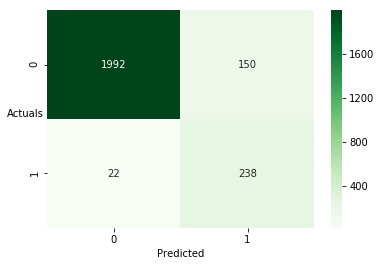

In [78]:
# Model Evalution on train data

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(Default_train['default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Greens');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [79]:
print(metrics.classification_report(Default_train['default'],y_class_pred,digits=3))

              precision    recall  f1-score   support

           0      0.989     0.930     0.959      2142
           1      0.613     0.915     0.735       260

    accuracy                          0.928      2402
   macro avg      0.801     0.923     0.847      2402
weighted avg      0.948     0.928     0.934      2402



In [80]:
# predicted probability values on test dataset

y_prob_pred_test = model_9.predict(Default_test)
y_prob_pred_test.round(3).head(20)

251     0.706
3493    0.000
3063    0.000
2384    0.001
1679    0.016
604     0.003
3434    0.000
2244    0.000
2523    0.000
2162    0.000
3102    0.000
1638    0.101
2046    0.000
1241    0.143
133     0.255
2294    0.001
2139    0.000
2844    0.011
1360    0.050
2896    0.000
dtype: float64

In [81]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.1689:
        a=1
    else:
        a=0
    y_class_pred.append(a)

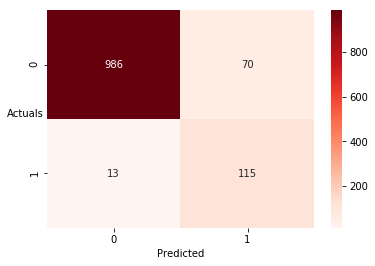

In [82]:
# Model Evaluation on the test data

sns.heatmap((metrics.confusion_matrix(Default_test['default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Reds');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [83]:
print(metrics.classification_report(Default_test['default'],y_class_pred,digits=3))

              precision    recall  f1-score   support

           0      0.987     0.934     0.960      1056
           1      0.622     0.898     0.735       128

    accuracy                          0.930      1184
   macro avg      0.804     0.916     0.847      1184
weighted avg      0.947     0.930     0.935      1184

